## Анализ изображений

В данном примере используется фрагмент набора  данных Cats and Dogs Classification Dataset

В наборе данных два класса: кошки и собаки

Из каждого класса было случайным образом выбрано по 100 изображений (всего 200)

Ссылка: https://www.kaggle.com/datasets/bhavikjikadara/dog-and-cat-classification-dataset

Для работы с изображениями используются библиотеки opencv и scikit-image

Ссылка на оф. документацию: 
- https://docs.opencv.org/4.x/d6/d00/tutorial_py_root.html
- https://scikit-image.org/docs/stable/

### Обработка изображений

#### Загрузка и показ изображения

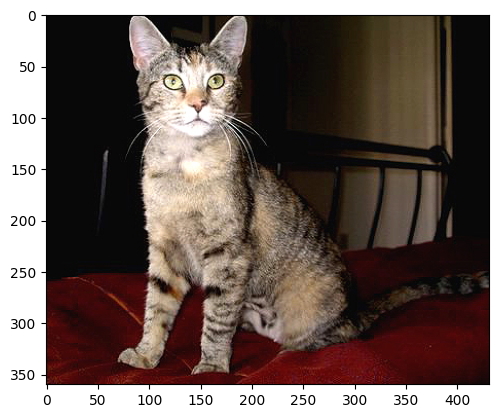

In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np

empty = np.empty(0)

# Читаем изображение
image = cv2.imread("data/images/cat-dog/cat/10000.jpg")
if image is None:
    display("Can't load image")
else:
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.show()
    # cv2.imwrite("filename.png", image)

#### Получение размера изображения

In [2]:
h, w, _ = image_rgb.shape
display(f"{w}x{h}px")

size = image_rgb.size
display(size)

'431x360px'

465480

#### Получение фрагмента изображения

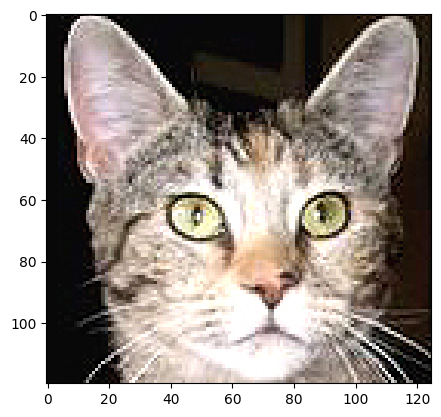

In [3]:
cropped_image = image_rgb[0:120, 75:200]  # ось Y, ось X
plt.imshow(cropped_image)
plt.show()

#### Изменение размера изображения

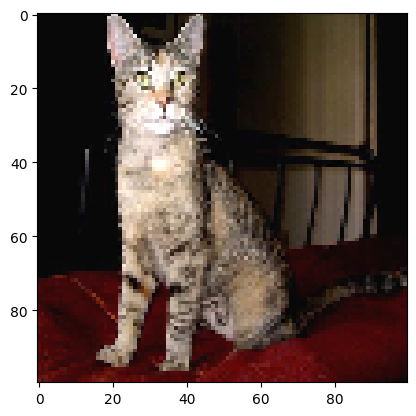

30000

In [4]:
resized = cv2.resize(image_rgb, (100, 100))

plt.imshow(resized)
plt.show()

display(resized.size)

#### Получение RGB матрицы

array([[  8,   8,   8, ...,   8,   8,   8],
       [  8,   8,   8, ...,   8,   8,   8],
       [  8,   8,   8, ...,   8,   8,   8],
       ...,
       [ 83,  78,  88, ...,  22,  24,  23],
       [ 92, 110, 106, ...,  17,  17,  17],
       [115,  92,  68, ...,  18,  18,  18]], shape=(360, 431), dtype=uint8)

array([[ 8,  8,  8, ...,  8,  8,  8],
       [ 8,  8,  8, ...,  8,  8,  8],
       [ 8,  8,  8, ...,  8,  8,  8],
       ...,
       [21, 20, 22, ...,  8,  8,  9],
       [30, 42, 40, ...,  8,  8,  8],
       [46, 30,  4, ...,  8,  8,  8]], shape=(360, 431), dtype=uint8)

array([[ 8,  8,  8, ...,  8,  8,  8],
       [ 8,  8,  8, ...,  8,  8,  8],
       [ 8,  8,  8, ...,  8,  8,  8],
       ...,
       [ 6,  8, 10, ...,  8,  9,  9],
       [ 5, 33, 18, ...,  9,  9,  9],
       [13, 15,  4, ...,  9,  9,  9]], shape=(360, 431), dtype=uint8)

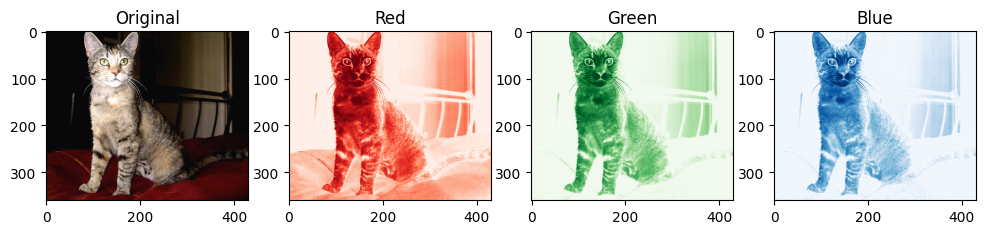

In [74]:
r, g, b = cv2.split(image_rgb)
display(r, g, b)

fig, axes = plt.subplots(1, 4, figsize=(12, 8))
axes[0].imshow(image_rgb)
axes[0].set_title("Original")
axes[1].imshow(r, cmap="Reds")
axes[1].set_title("Red")
axes[2].imshow(g, cmap="Greens")
axes[2].set_title("Green")
axes[3].imshow(b, cmap="Blues")
axes[3].set_title("Blue")
plt.show()

#### Изменение гаммы изображения

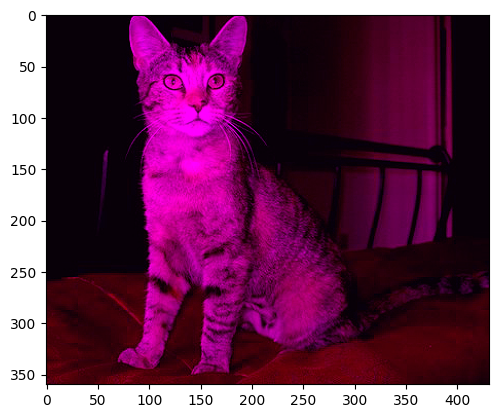

In [6]:
new_greenless_image = cv2.merge([r, g * 0, b])
plt.imshow(new_greenless_image)
plt.show()

#### Встроенные методы преобразования гаммы

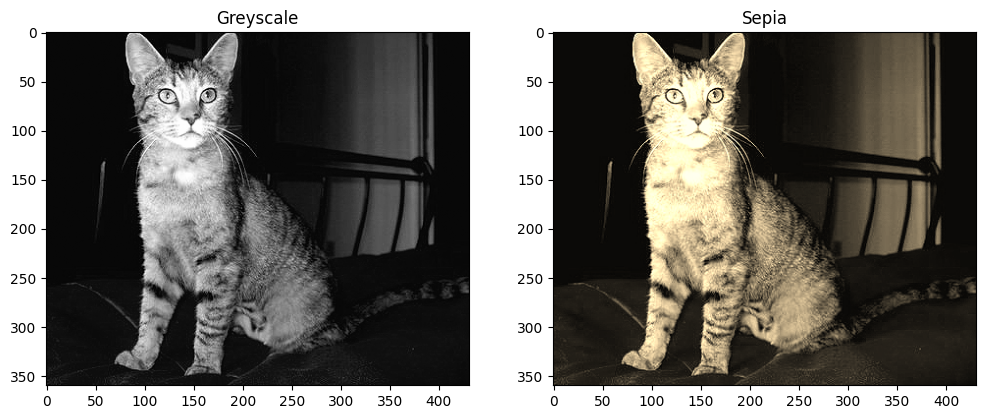

In [7]:
import numpy as np

grey_image = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2GRAY)

# Матрица коэффициентов для классической сепии
sepia_kernel = np.array(
    [[0.393, 0.769, 0.189], [0.349, 0.686, 0.168], [0.272, 0.534, 0.131]]
)
sepia_image = cv2.transform(image_rgb, sepia_kernel)
# Обрезаем значения > 255 и приводим к uint8
sepia_image = np.clip(sepia_image, 0, 255).astype(np.uint8)


fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(grey_image, cmap="gray")
axes[0].set_title("Greyscale")
axes[1].imshow(sepia_image)
axes[1].set_title("Sepia")
plt.show()

#### Бинаризация изображения

1. Вычисляется порог
2. Все пикселы > порога заменяются на 1
3. Все пикселы < порога заменяются на 0

Когда нужно быстро убрать фон и оставить только «силуэт» объекта для дальнейшего анализа формы или размера.

1. Распознавание текста (OCR)
2. Промышленный контроль качества
3. Медицинская диагностика
4. Робототехника и навигация
5. Сегментация объектов (Background Subtraction)

'Otsu threshold = 90.0'

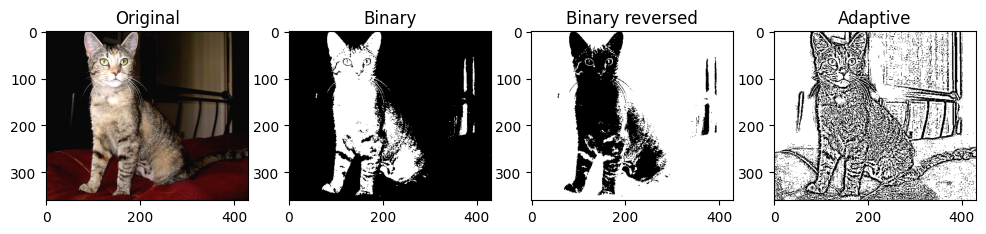

In [8]:
tresh, binary_otsu = cv2.threshold(
    grey_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
)
_, binary_otsu_inv = cv2.threshold(
    grey_image, 0, 255, cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)
display(f"Otsu threshold = {tresh}")

image_adaptive = cv2.adaptiveThreshold(
    grey_image, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, 11, 2
)

fig, axes = plt.subplots(1, 4, figsize=(12, 8))
axes[0].imshow(image_rgb)
axes[0].set_title("Original")
axes[1].imshow(binary_otsu, cmap="gray")
axes[1].set_title("Binary")
axes[2].imshow(binary_otsu_inv, cmap="gray")
axes[2].set_title("Binary reversed")
axes[3].imshow(image_adaptive, cmap="gray")
axes[3].set_title("Adaptive")
plt.show()

#### Изменение контрастности изображения

CLAHE (Contrast Limited Adaptive Histogram Equalization) — это «умное» улучшение контраста. В отличие от простой бинаризации, он не превращает всё в черное и белое, а вытягивает детали в слишком темных или светлых участках, разбивая изображение на плитки (tiles).

Главное отличие от бинаризации: если бинаризация — это инструмент для разделения (объект/фон), то CLAHE — это инструмент для проявления (сделать невидимое видимым). 

Маленький clipLimit -> слабый эффект.\
Большой clipLimit -> усиливается контраст, но может проявиться шум. \
Маленький тайл -> детализация, но артефакты. \
Большой тайл -> эффект приближается к глобальному выравниванию.

1. Медицинская визуализация
2. Съемка в сложных условиях (Туман, Дым, Под водой)
3. Неравномерное или слабое освещение
4. Подготовка к работе нейросетей
5. Спутниковые снимки и астрономия

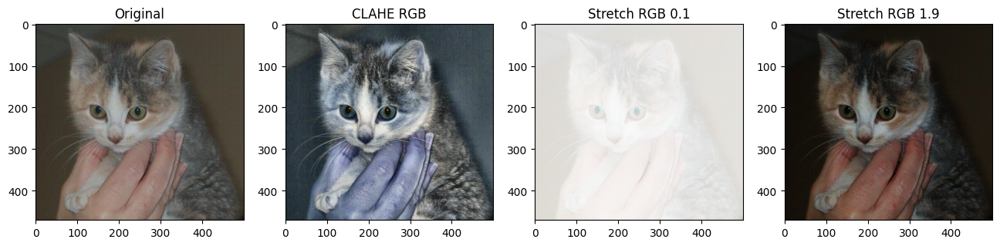

In [9]:
def stretch(img: np.ndarray) -> np.ndarray:
    # Растягиваем диапазон в [0, 255]
    return cv2.normalize(img, empty, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)


other_image = cv2.imread("data/images/cat-dog/cat/10002.jpg")
if other_image is None:
    display("Can't load image")
else:
    other_image_rgb = cv2.cvtColor(other_image, cv2.COLOR_BGR2RGB)

# Применение CLAHE к цветному изображению
# Переходим в пространство LAB (L - яркость, A и B - цветовые компоненты)
# Применяем CLAHE только к каналу яркости L
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
lab = cv2.cvtColor(other_image_rgb, cv2.COLOR_BGR2LAB)
ll, la, lb = cv2.split(lab)
l_enhanced = clahe.apply(ll)
lab_enhanced = cv2.merge((l_enhanced, la, lb))
image_clahe = cv2.cvtColor(lab_enhanced, cv2.COLOR_LAB2RGB)

# Подготовка версий с разной степенью (важно использовать float)
img_float = other_image_rgb.astype(np.float32)
pow_01 = np.power(img_float, 0.1)
pow_19 = np.power(img_float, 1.9)

# Отрисовка
fig, axes = plt.subplots(1, 4, figsize=(16, 8))

axes[0].imshow(other_image_rgb)
axes[0].set_title("Original")
axes[1].imshow(image_clahe)
axes[1].set_title("CLAHE RGB")
axes[2].imshow(stretch(pow_01))
axes[2].set_title("Stretch RGB 0.1")
axes[3].imshow(stretch(pow_19))
axes[3].set_title("Stretch RGB 1.9")
plt.show()

#### Размытие с помощью фильтра Гаусса

Фильтр Гаусса (Gaussian Blur) — это инструмент для «сглаживания» изображения. В отличие от обычного усредняющего размытия, он использует математическую функцию (колокол Гаусса), где центральный пиксель имеет наибольший вес, а окружающие — плавно убывающий.

1. Подавление высокочастотного шума
2. Подготовка к поиску границ (Canny Edge Detection)
3. Предварительный этап перед бинаризацией
4. Создание пирамид изображений (Downsampling)
5. Скрытие конфиденциальных данных

При использовании фильтра Гаусса важно правильно подобрать ядро (размер области размытия, например 3х3 или 5х5 и сигму (среднеквадратичное отклонение). Слишком большое размытие может уничтожить полезную информацию.

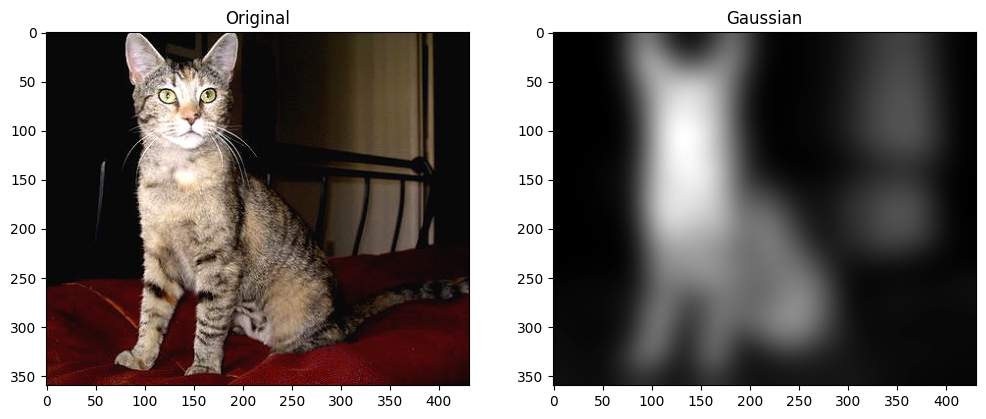

In [10]:
gaussian_image = cv2.GaussianBlur(grey_image, (0, 0), sigmaX=16).astype("uint8")

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(image_rgb, cmap="gray")
axes[0].set_title("Original")
axes[1].imshow(gaussian_image, cmap="gray")
axes[1].set_title("Gaussian")
plt.show()

#### Выделение маски объекта

Выделение маски (Image Masking) — это процесс создания бинарного (черно-белого) слоя, где белые пиксели (1) обозначают интересующую область, а черные (0) — всё остальное. Это фундаментальный этап, когда нужно отделить «что» от «где».

1. Выделение объектов по цвету (Color Thresholding)
2. Удаление или замена фона (Background Removal)
3. Попиксельная сегментация в ИИ
4. Локальная обработка (Region of Interest — ROI)
5. Медицинская разметка
6. Комбинирование изображений (Inpainting)

Обычно маска создается после бинаризации или цветовой фильтрации, а затем используется как фильтр: Итоговое_изображение = Исходник * Маска.

Otsu threshold = 76.0


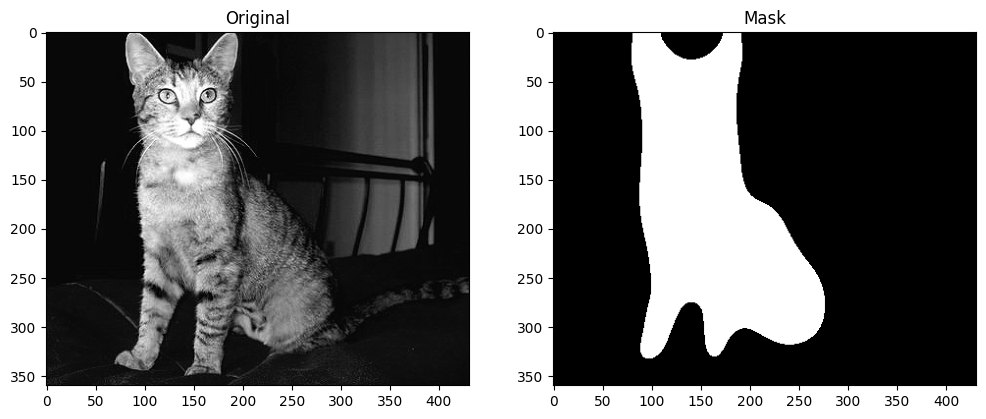

In [11]:
# Требуется изображение с одним каналом
# Используется приведение к градациям серого
tresh_val, image_mask = cv2.threshold(
    gaussian_image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU
)
print(f"Otsu threshold = {tresh_val}")

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(grey_image, cmap="gray")
axes[0].set_title("Original")
axes[1].imshow(image_mask, cmap="gray")
axes[1].set_title("Mask")
plt.show()

#### Наложение маски

Наложение маски (Image Masking/Blending) — это процесс применения созданного «трафарета» к исходному изображению. Если выделение маски — это создание чертежа, то наложение — это физическое «вырезание» или «склеивание».

1. Извлечение объекта (Cropping)
2. Применение эффектов к выбранной области (ROI)
3. Наложение виртуальных объектов (AR и Геймдев)
4. Комбинирование снимков (Image Composition)
5. Побитовые операции в программировании (Bitwise AND)
6. Скрытие конфиденциальной информации

Как это работает математически:
Каждый пиксель изображения умножается на значение маски.
Цвет * 1 (белый) = Цвет остается
Цвет * 0 (черный) = Черный пиксель

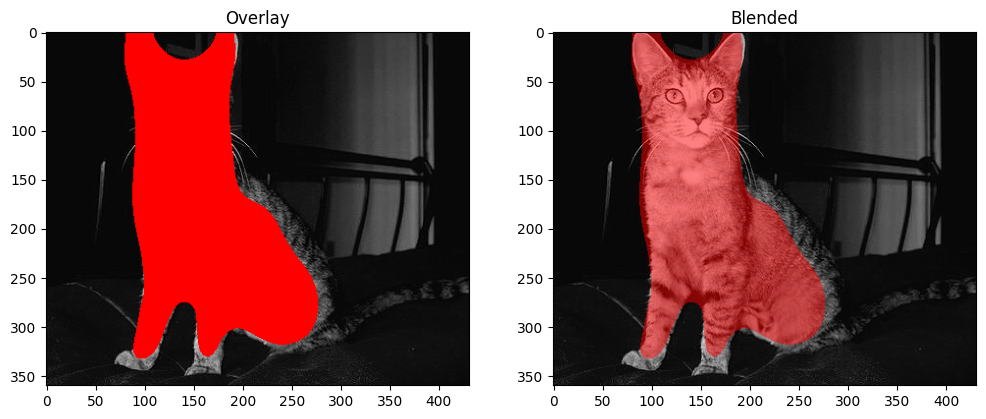

In [12]:
# Необходимо 3 канала
# Конвертируем
gray_base = cv2.cvtColor(grey_image, cv2.COLOR_GRAY2RGB)
overlay = gray_base.copy()
# Там, где маска белая (255), устанавливаем красный цвет [255, 0, 0]
overlay[image_mask == 255] = [255, 0, 0]
# Делаем маску прозрачной
alpha = 0.5
blended = cv2.addWeighted(overlay, alpha, gray_base, 1 - alpha, 0)

fig, axes = plt.subplots(1, 2, figsize=(12, 8))
axes[0].imshow(overlay, cmap="gray")
axes[0].set_title("Overlay")
axes[1].imshow(blended, cmap="gray")
axes[1].set_title("Blended")
plt.show()

#### Выделение объектов на изображении (сегментация)

Сегментация — это процесс разделения изображения на отдельные смысловые группы пикселей. В отличие от простой бинаризации, сегментация пытается ответить на вопрос: «Где заканчивается один объект и начинается другой?»

1. Беспилотный транспорт (Self-Driving Cars)
2. Медицинская диагностика (Анализ КТ и МРТ)
3. Интеллектуальное редактирование фото
4. Робототехника и логистика
5. Спутниковый мониторинг и экология
6. Контроль качества на производстве

Если бинаризация — это «черное и белое», то сегментация — это «каждому объекту свой цвет или класс».

'Найдено объектов: 11'

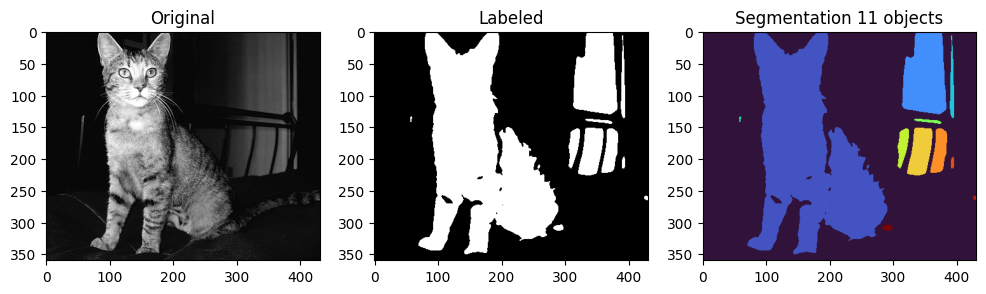

In [13]:
gaussian_new = cv2.GaussianBlur(grey_image, (0, 0), sigmaX=2)
mean_val = gaussian_new.mean()
_, labeled_mask = cv2.threshold(gaussian_new, mean_val, 255, cv2.THRESH_BINARY)

# Маркировка объектов (Connected Components)
# num_labels — количество найденных объектов + фон
# labels — массив, где каждый объект помечен своим числом (0, 1, 2...)
num_labels, labels = cv2.connectedComponents(labeled_mask)
display(f"Найдено объектов: {num_labels - 1}")

fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(grey_image, cmap="gray")
axes[0].set_title("Original")
axes[1].imshow(labeled_mask, cmap="gray")
axes[1].set_title("Labeled")
axes[2].imshow(labels, cmap="turbo")
axes[2].set_title(f"Segmentation {num_labels - 1} objects")
plt.show()

#### Удаление объектов и выделение границ объектов

1. Удаление объектов (Inpainting / Filtering) \
Используется, когда нужно убрать «визуальный шум» или нежелательные предметы, сохранив целостность фона.

2. Выделение границ (Edge Detection) \
Используется для поиска контуров и структурных линий (чаще всего алгоритмом Кэнни или Собеля).

3. Совместное применение (Pipeline)

Удаление объектов упрощает сцену, а выделение границ превращает её в математическую модель из линий.

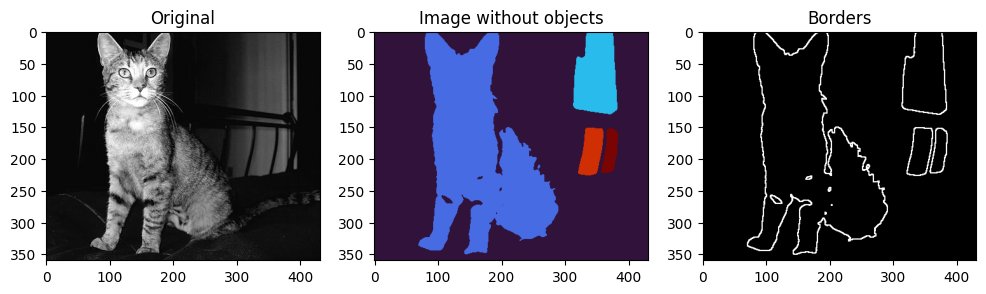

In [14]:
# Получаем компоненты с расширенной статистикой
# stats содержит: [x, y, width, height, area]
num_labels, labels, stats, centroids = cv2.connectedComponentsWithStats(labeled_mask)

# Фильтруем объекты по размеру (area < 1000)
# Создаем копию labels и заменяем 0 те объекты, чья площадь меньше 1000
image_without_objects = labels.copy()
for i in range(1, num_labels):  # начинаем с 1, так как 0 — это фон
    if stats[i, cv2.CC_STAT_AREA] < 1000:
        image_without_objects[labels == i] = 0

# Находим границы (Borders)
binary_cleaned = (image_without_objects > 0).astype(np.uint8) * 255
# В OpenCV границы проще всего получить через морфологический градиент (dilate - erode)
border_image = cv2.morphologyEx(
    binary_cleaned, cv2.MORPH_GRADIENT, np.ones((3, 3), np.uint8)
)

fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(grey_image, cmap="gray")
axes[0].set_title("Original")
axes[1].imshow(image_without_objects, cmap="turbo")
axes[1].set_title("Image without objects")
axes[2].imshow(border_image, cmap="gray")
axes[2].set_title("Borders")
plt.show()

#### Выделение границ на основе оператора Собеля

Ссылка: https://ru.wikipedia.org/wiki/Оператор_Собеля

Оператор Собеля (Sobel Operator) — это классический метод поиска границ, который основан на вычислении градиента яркости. В отличие от детектора Кэнни, Собель не просто рисует тонкую линию, а показывает, насколько резко и в каком направлении меняется цвет.

1. Определение ориентации и наклона объектов
2. Подготовка карт градиентов для нейросетей
3. Анализ четкости и фокусировки (Autofocus)
4. Медицинская визуализация (Рентген и КТ)
5. Сжатие данных и детекция движения

Оператор Собеля устойчив к небольшим шумам (благодаря встроенному сглаживанию), но дает «толстые» границы. Если вам нужны тонкие линии в один пиксель, после Собеля обычно применяют уточняющие алгоритмы.

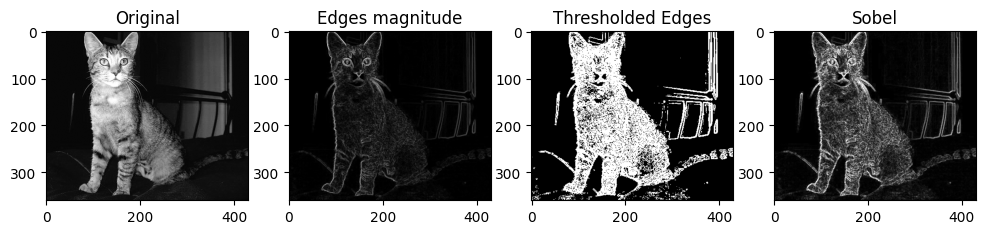

In [15]:
# Считаем градиенты (аналог convolve с ядрами Собеля)
edges_horizontal = cv2.Sobel(
    grey_image, cv2.CV_64F, 0, 1, ksize=3
)  # По Y (горизонтальные линии)
edges_vertical = cv2.Sobel(
    grey_image, cv2.CV_64F, 1, 0, ksize=3
)  # По X (вертикальные линии)

# Считаем магнитуду (интенсивность границ)
edges_magnitude = cv2.magnitude(edges_vertical, edges_horizontal)
# Пороговая обработка (Threshold)
threshold = 50
thresholded_edges = edges_magnitude > threshold

# Встроенный Sobel в OpenCV (обычно берется сумма абсолютных значений)
# Это самый быстрый способ получить готовый результат
abs_grad_x = cv2.convertScaleAbs(edges_vertical)
abs_grad_y = cv2.convertScaleAbs(edges_horizontal)
sobel = cv2.addWeighted(abs_grad_x, 0.5, abs_grad_y, 0.5, 0)

fig, axes = plt.subplots(1, 4, figsize=(12, 8))
axes[0].imshow(grey_image, cmap="gray")
axes[0].set_title("Original")
axes[1].imshow(edges_magnitude, cmap="gray")
axes[1].set_title("Edges magnitude")
axes[2].imshow(thresholded_edges, cmap="gray")
axes[2].set_title("Thresholded Edges")
axes[3].imshow(sobel, cmap="gray")
axes[3].set_title("Sobel")
plt.show()

#### Детектор Canny

Детектор Кэнни (Canny Edge Detection) считается «золотым стандартом» поиска границ. В отличие от оператора Собеля, он выполняет многостадийную обработку, чтобы оставить только самые тонкие и четкие линии.

1. Высокоточное измерение геометрии
2. Распознавание структур и форм (Sketching)
3. Классификация объектов по контуру
4. Векторизация изображений
5. Сегментация текста в сложных условиях
6. Робототехника (SLAM)

Почему выбирают именно Кэнни:
- Подавление шума: В него уже встроено размытие по Гауссу.
- Тонкие линии: Он удаляет «жирные» пиксели, оставляя только пик градиента.
- Двойной порог: Он умеет соединять слабые границы с сильными, предотвращая разрывы контура.

high отсекает шум, а low позволяет "дорисовывать" прерывистые линии, соединяя их с сильными.

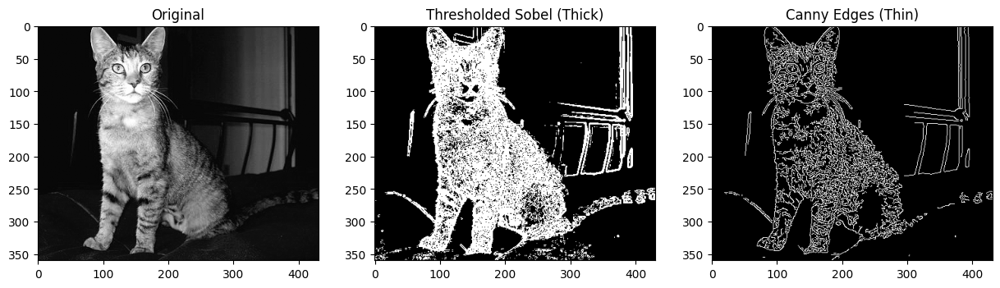

In [16]:
# Детектор Canny требует два порога:
# нижний (low) и верхний (high) для гистерезиса
# Обычно их подбирают в соотношении 1:2 или 1:3
edges_canny = cv2.Canny(grey_image, 100, 200)

# Сравним с оператором Собеля
fig, axes = plt.subplots(1, 3, figsize=(15, 8))
axes[0].imshow(grey_image, cmap="gray")
axes[0].set_title("Original")
axes[1].imshow(thresholded_edges, cmap="gray")
axes[1].set_title("Thresholded Sobel (Thick)")
axes[2].imshow(edges_canny, cmap="gray")
axes[2].set_title("Canny Edges (Thin)")
plt.show()

#### Морфологическая обработка изображений

Морфологическая обработка — это работа с формой объектов. Эти операции обычно применяются к бинарным (черно-белым) изображениям, чтобы «подправить» результат сегментации или бинаризации.

Вот основные случаи, когда используются дилатация и эрозия:
1. Дилатация (Расширение) \
Этот метод «раздувает» светлые области, заполняя дыры и соединяя разрозненные части:
- Соединение разорванных линий: Если после выделения границ (например, детектором Кэнни) линия получилась пунктирной, дилатация поможет сделать её сплошной. 
- Заполнение пустот внутри объекта: Если при бинаризации внутри объекта остались черные «дырки» из-за бликов или шума, дилатация их «затянет».
- Утолщение шрифта: В задачах OCR, если буквы слишком тонкие и плохо читаются, их делают жирнее для лучшего распознавания.
2. Эрозия (Сужение) \
Этот метод «съедает» края светлых объектов, удаляя мелкие детали:
- Удаление мелкого шума: Если на фоне остались мелкие белые точки («мусор»), эрозия их полностью сотрет, так как они меньше шаблона.
- Разъединение слипшихся объектов: Если два объекта стоят слишком близко и после бинаризации слились в одно пятно, эрозия поможет их разделить, «протравив» узкий перешеек между ними.
- Поиск скелета объекта: Эрозию используют как первый шаг для того, чтобы оставить только центральную линию (остов) объекта.
3. Совместное применение (Открытие и Закрытие) \
На практике дилатацию и эрозию редко используют по отдельности, их комбинируют:
- Операция «Открытие» (Opening = Эрозия → Дилатация): Нужно удалить мелкий белый шум, но сохранить размер основных объектов.
- Операция «Закрытие» (Closing = Дилатация → Эрозия): Нужно закрыть мелкие дыры и трещины внутри объекта, не меняя его общий размер.
4. Вычисление морфологического градиента \
Если из результата дилатации вычесть результат эрозии, получится контур объекта.

Результат сильно зависит от структурного элемента (ядра). Например, прямоугольное ядро лучше работает с текстом, а круглое — с объектами природной формы.

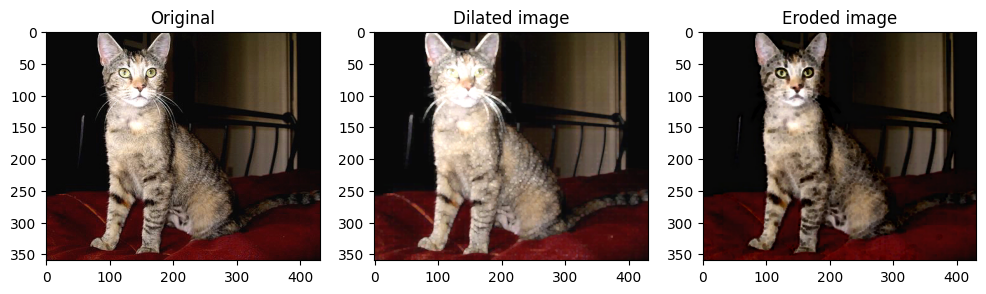

In [17]:
# Создаем ядро (структурный элемент)
kernel = np.ones((3, 3), np.uint8)

# Дилатация (расширение светлых областей)
dilate_img = cv2.dilate(image_rgb, kernel, iterations=1)

# Эрозия (сужение светлых областей / расширение темных)
erode_img = cv2.erode(image_rgb, kernel, iterations=1)

fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(image_rgb)
axes[0].set_title("Original")
axes[1].imshow(dilate_img)
axes[1].set_title("Dilated image")
axes[2].imshow(erode_img)
axes[2].set_title("Eroded image")
plt.show()

#### Открытие и закрытие изображений

Открытие - это операция, которая включает в себя сначала вызов оператора эрозии, а после вызывается оператор дилатации над полученным изображение после оператора эрозии.

Закрытие - это операция, которая включает в себя сначала вызов операции дилатации, а после вызывается операция эрозии над полученным изображением после операции дилатации.

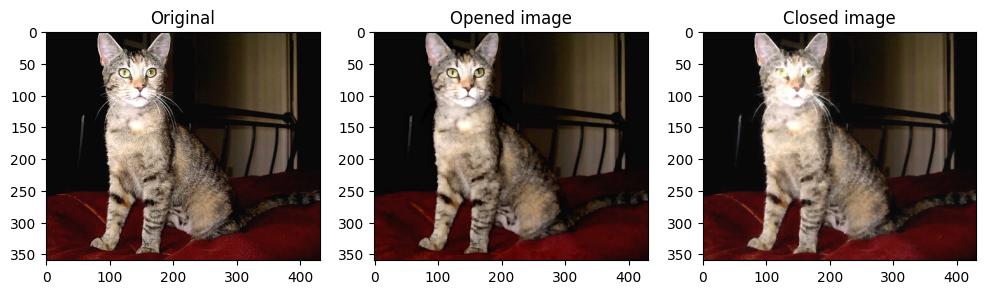

In [18]:
# Для заметного эффекта на больших фото можно взять (5, 5)
# kernel = np.ones((5, 5), np.uint8)

# Opening: удаляет светлый шум (маленькие точки)
opened_image = cv2.morphologyEx(image_rgb, cv2.MORPH_OPEN, kernel)

# Closing: закрывает темные дыры/трещины
closed_image = cv2.morphologyEx(image_rgb, cv2.MORPH_CLOSE, kernel)

fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(image_rgb)
axes[0].set_title("Original")
axes[1].imshow(opened_image)
axes[1].set_title("Opened image")
axes[2].imshow(closed_image)
axes[2].set_title("Closed image")
plt.show()

#### Локальный максимум и минимум (Local Maxima & Local minima)

Поиск локальных экстремумов (Local Maxima & Minima) — это способ найти «ключевые точки» или центры объектов на изображении. Этот метод работает не с контурами, а с интенсивностью (яркостью) или результатами математических преобразований.

Локальный максимум — это пиксель, значение которого совпадает с максимальным значением в его окрестности.

1. Поиск центров объектов (Blob Detection)
2. Детектирование углов (Harris Corner Detector)
3. Разделение слипшихся объектов (Watershed Algorithm)
4. Поиск «впадин» и дефектов (Local Minima)
5. Сравнение изображений (Feature Matching)

Чтобы найти экстремум, программа сравнивает пиксель с его соседями на основе окна (3х3 или 5х5)

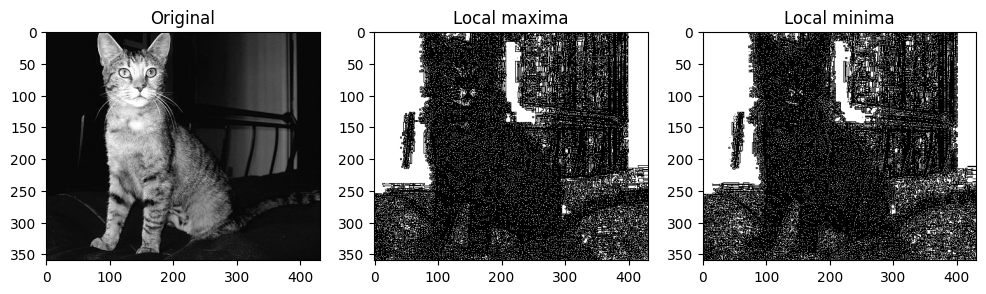

In [19]:
# Находим локальные максимумы
# Дилатация заменяет каждый пиксель максимальным значением в окне 3x3
local_max_values = cv2.dilate(grey_image, kernel)
# Пиксель является локальным максимумом, если его исходное значение равно результату дилатации
maxima = grey_image == local_max_values

# Находим локальные минимумы
# Эрозия заменяет каждый пиксель минимальным значением в окне 3x3
local_min_values = cv2.erode(grey_image, kernel)
minima = grey_image == local_min_values

fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(grey_image, cmap="gray")
axes[0].set_title("Original")
axes[1].imshow(maxima, cmap="gray")
axes[1].set_title("Local maxima")
axes[2].imshow(minima, cmap="gray")
axes[2].set_title("Local minima")
plt.show()

#### Генерация и удаление шумов

Удаление шумов (Denoising) очищает данные для анализа, а генерация (Noise Injection) помогает сделать алгоритмы более устойчивыми.

1. Удаление специфических помех
2. Текстурный анализ и криптография
3. Оценка качества датчиков

Краткий итог:
- Удаляем шум, когда хотим подготовить картинку для человека или алгоритма сегментации.
- Генерируем шум, когда хотим подготовить алгоритм к суровым реальным условиям.

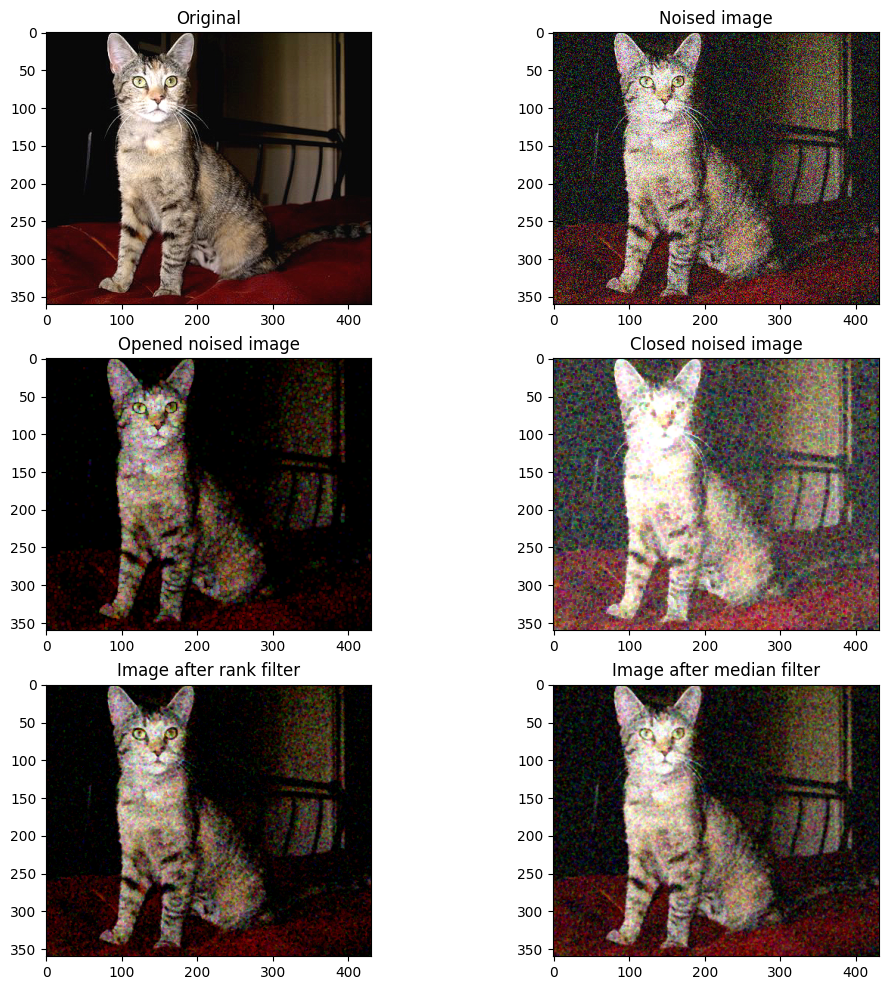

In [20]:
from scipy import ndimage

noise_level = 60.0
seed = 42
generator = np.random.default_rng(seed)
noise = generator.normal(0.0, noise_level, image_rgb.shape)
noised_image = np.clip((image_rgb + noise), 0, 255).astype("uint8")

noised_image_open = cv2.morphologyEx(noised_image, cv2.MORPH_OPEN, kernel)
noised_image_close = cv2.morphologyEx(noised_image, cv2.MORPH_CLOSE, kernel)
# Ранговый фильтр (rank_filter)
# Для работы с цветным фото применяем к каждому каналу
rank_filtered = np.zeros_like(noised_image)
for i in range(3):
    rank_filtered[:, :, i] = ndimage.rank_filter(noised_image[:, :, i], rank=2, size=3)
# Медианный фильтр (median_filter)
# В OpenCV размер ядра должен быть нечетным целым числом (например, 3)
median_filtered = cv2.medianBlur(noised_image.astype("uint8"), 3)

fig, axes = plt.subplots(3, 2, figsize=(12, 12))
axes[0][0].imshow(image_rgb)
axes[0][0].set_title("Original")
axes[0][1].imshow(noised_image)
axes[0][1].set_title("Noised image")
axes[1][0].imshow(noised_image_open)
axes[1][0].set_title("Opened noised image")
axes[1][1].imshow(noised_image_close)
axes[1][1].set_title("Closed noised image")
axes[2][0].imshow(rank_filtered)
axes[2][0].set_title("Image after rank filter")
axes[2][1].imshow(median_filtered)
axes[2][1].set_title("Image after median filter")
plt.show()

#### Фильтра Лапласа (2D Laplacian Filter)

Фильтр Лапласа (2D Laplacian) — это детектор «второй производной», который реагирует на резкие изменения интенсивности. Если оператор Собеля ищет направление склона, то Лапласиан ищет сами «пики» и «впадины», что делает его крайне чувствительным к мелким деталям.

1. Оценка размытости изображения (Blur Detection)
2. Повышение резкости (Sharpening)
3. Детекция краев без привязки к направлению
4. Поиск изолированных точек и тонких линий
5. Пирамида Лапласа (Сжатие и синтез)
6. Анализ текстур

Лапласиан очень чувствителен к шуму. Если на фото есть «зерно», фильтр примет каждую зернинку за край объекта. Поэтому перед ним почти всегда применяют фильтр Гаусса (этот тандем называется LoG — Laplacian of Gaussian).

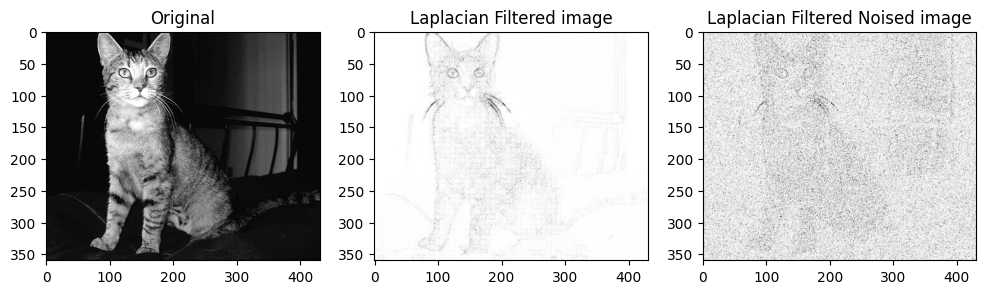

In [21]:
# Применяем фильтр Лапласа к серому изображению
# Используем CV_64F, чтобы не потерять отрицательные значения градиента
lap_filtered_image = cv2.Laplacian(grey_image, cv2.CV_64F)
lap_norm = cv2.normalize(
    np.absolute(lap_filtered_image), empty, 0, 255, cv2.NORM_MINMAX
).astype(np.uint8)

# Подготовка зашумленного изображения
# Переводим в серый (если оно было цветным) и применяем Лаплас
noised_grey = cv2.cvtColor(noised_image.astype("uint8"), cv2.COLOR_RGB2GRAY)
lap_noised_image = cv2.Laplacian(noised_grey, cv2.CV_64F)
lap_noised_norm = cv2.normalize(
    np.absolute(lap_noised_image), empty, 0, 255, cv2.NORM_MINMAX
).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(grey_image, cmap="gray")
axes[0].set_title("Original")
axes[1].imshow(cv2.bitwise_not(lap_norm), cmap="grey")
axes[1].set_title("Laplacian Filtered image")
axes[2].imshow(cv2.bitwise_not(lap_noised_norm), cmap="grey")
axes[2].set_title("Laplacian Filtered Noised image")
plt.show()

#### Помещение центра изображения в фокус

Помещение центра изображения в фокус (Centering & Focusing) — это процесс геометрической и оптической коррекции, при котором главная визуальная информация концентрируется в центральной части кадра.

1. Автоматическое кадрирование (Smart Cropping)
2. Системы слежения (Object Tracking)
3. Исправление оптических искажений (Vignetting & Distortion)
4. Визуальный поиск и классификация (Image Retrieval)
5. Медицинская микроскопия
6. Панорамная съемка и склейка (Stitching)

Обычно это комбинация Crop (обрезка) и Resize (изменение размера) или использование аффинных преобразований для смещения системы координат изображения.

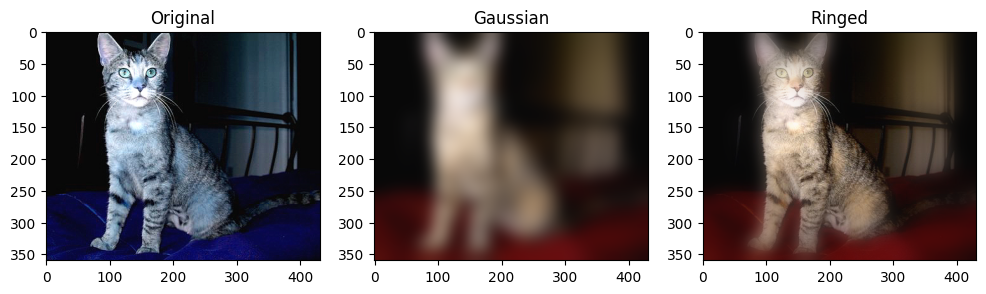

In [22]:
# Размытие изображения
image_gaussian = cv2.GaussianBlur(image_rgb, (0, 0), sigmaX=12)

# Создаем сетку координат
h, w, _ = image_rgb.shape
y, x = np.mgrid[:h, :w]
y = (y - h / 2) / (h / 2)
x = (x - w / 2) / (w / 2)

# Вычисляем экспоненциальную маску (C)
c = np.exp(-2 * (x**2 + y**2))
c = (c - c.min()) / (c.max() - c.min())
c = c[:, :, np.newaxis]

# Смешивание (Image * C + Gaussian * (1 - C))
# Используем float для вычислений, чтобы избежать переполнения
ringed = image_rgb.astype(np.float32) * c + image_gaussian.astype(np.float32) * (1 - c)
ringed = cv2.normalize(ringed, empty, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

fig, axes = plt.subplots(1, 3, figsize=(12, 8))
axes[0].imshow(image)
axes[0].set_title("Original")
axes[1].imshow(image_gaussian)
axes[1].set_title("Gaussian")
axes[2].imshow(ringed)
axes[2].set_title("Ringed")
plt.show()

#### Визуализация изображений в виде гистограмм

Визуализация в виде гистограмм — это построение графика распределения яркости или цветов. Она показывает, сколько пикселей каждого оттенка (от 0 до 255) присутствует в кадре, и является «кардиограммой» изображения.

1. Оценка экспозиции (Фото и видео)
2. Настройка контрастности (Contrast Stretching)
3. Выбор порога бинаризации (Threshold Selection)
4. Выравнивание освещенности (Histogram Equalization / CLAHE)
5. Поиск объектов по цвету (Color Indexing)
6. Детекция смены сцен в видео

Ось X: Яркость (0 — черный, 255 — белый).\
Ось Y: Количество пикселей данной яркости.

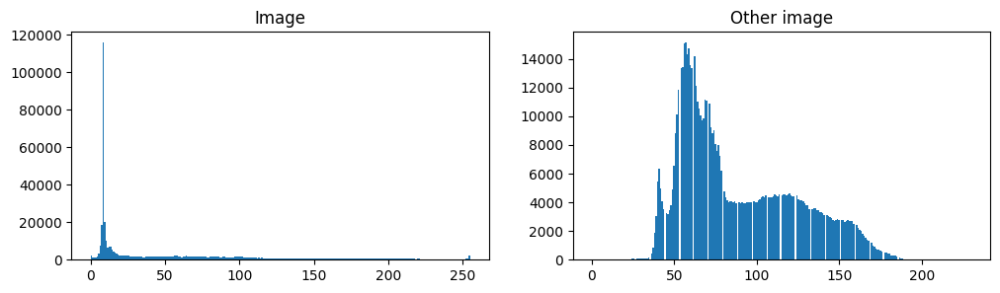

In [80]:
fig, axes = plt.subplots(1, 2, figsize=(12, 3))
axes[0].hist(image_rgb.ravel(), bins=256)
axes[0].set_title("Image")
axes[1].hist(other_image_rgb.ravel(), bins=256)
axes[1].set_title("Other image")
plt.show()

### Векторизация изображений

#### Векторизация на основе текстуры изображения Харалика (Haralick)

Текстурные признаки Харалика (Haralick Texture Features) — это математический способ описать «ощущение» от поверхности изображения: насколько она грубая, гладкая, зернистая или упорядоченная.

В отличие от гистограмм, которые считают только количество цветов, Харалик анализирует взаимное расположение пикселей через матрицу смежности (GLCM).

1. Классификация материалов и поверхностей
2. Медицинская диагностика (Radiomics)
3. Контроль качества текстиля и материалов
4. Анализ состояния почв и сельского хозяйства
5. Распознавание лиц и биометрия
6. Автоматическая сортировка мусора

Что именно вычисляет Харалик (основные метрики):
- Энергия (Energy): Показывает упорядоченность (высокая у повторяющихся узоров).
- Энтропия (Entropy): Показывает хаотичность (высокая у шума и сложных структур).
- Контраст (Contrast): Показывает резкость переходов между соседними пикселями.
- Корреляция (Correlation): Показывает наличие линейных структур (полос, волокон).

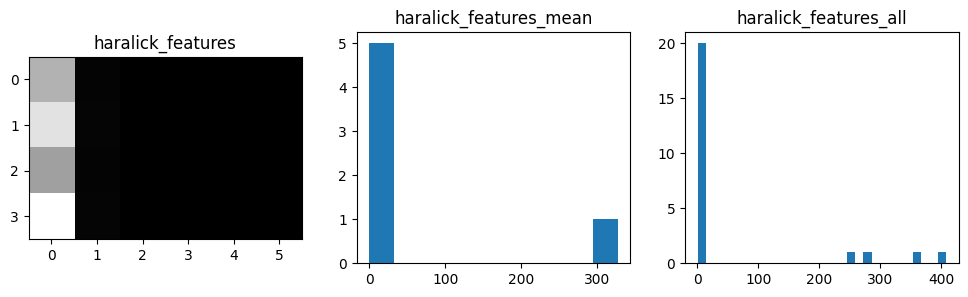

array([[2.85046143e+02, 7.44706072e+00, 4.26665880e-01, 1.94305779e-01,
        9.63367971e-01, 3.77547356e-02],
       [3.61758191e+02, 8.80958736e+00, 3.91734135e-01, 1.90661839e-01,
        9.53594006e-01, 3.63519370e-02],
       [2.55229828e+02, 6.97352145e+00, 4.46283762e-01, 1.96151959e-01,
        9.67219710e-01, 3.84755911e-02],
       [4.08061340e+02, 9.16652847e+00, 3.92296118e-01, 1.90636270e-01,
        9.47654200e-01, 3.63421874e-02]])

array([3.27523876e+02, 8.09917450e+00, 4.14244974e-01, 1.92938962e-01,
       9.57958972e-01, 3.72311128e-02])

array([2.85046143e+02, 7.44706072e+00, 4.26665880e-01, 1.94305779e-01,
       9.63367971e-01, 3.77547356e-02, 3.61758191e+02, 8.80958736e+00,
       3.91734135e-01, 1.90661839e-01, 9.53594006e-01, 3.63519370e-02,
       2.55229828e+02, 6.97352145e+00, 4.46283762e-01, 1.96151959e-01,
       9.67219710e-01, 3.84755911e-02, 4.08061340e+02, 9.16652847e+00,
       3.92296118e-01, 1.90636270e-01, 9.47654200e-01, 3.63421874e-02])

In [24]:
from skimage.feature import graycomatrix, graycoprops

# Извлекаем признаки Харалика
distances = [1]
angles = [0, np.pi / 4, np.pi / 2, 3 * np.pi / 4]
glcm = graycomatrix(
    grey_image,
    distances=distances,
    angles=angles,
    levels=256,
    symmetric=True,
    normed=True,
)

# Собираем матрицу признаков (4 направления x 6 основных свойств skimage)
properties = [
    "contrast",
    "dissimilarity",
    "homogeneity",
    "energy",
    "correlation",
    "ASM",
]
haralick_features = np.array([graycoprops(glcm, prop).ravel() for prop in properties]).T

# Подготовка данных для визуализации
haralick_features_mean = np.mean(haralick_features, axis=0)
haralick_features_all = haralick_features.ravel()

fig, axes = plt.subplots(1, 3, figsize=(12, 3))
axes[0].imshow(haralick_features, cmap="grey")
axes[0].set_title("haralick_features")
axes[1].hist(haralick_features_mean)
axes[1].set_title("haralick_features_mean")
axes[2].hist(haralick_features_all, bins=30)
axes[2].set_title("haralick_features_all")
plt.show()

display(haralick_features)
display(haralick_features_mean)
display(haralick_features_all)

#### Векторизация на основе моментов Ху (Hu moments)

Моменты Ху (Hu Moments) — это набора из 7 чисел, которые описывают геометрическую форму объекта. Их главная особенность в том, что они инвариантны: значения не меняются, если объект повернуть, перевернуть, перенести в другой угол кадра или изменить его размер (масштаб).

1. Распознавание плоских деталей и запчастей
2. Распознавание символов и цифр (OCR)
3. Классификация силуэтов (Силуэтный анализ)
4. Жестовое управление (Hand Gesture Recognition)
5. Поиск логотипов и торговых марок
6. Биология: классификация микроорганизмов

Входные данные: Обычно моменты Ху вычисляются по бинарной маске или контуру (после бинаризации или детектора Кэнни).

Логарифмическая шкала: Сами числа моментов часто имеют огромный разброс, поэтому для обучения моделей их обычно переводят в логарифмический вид.

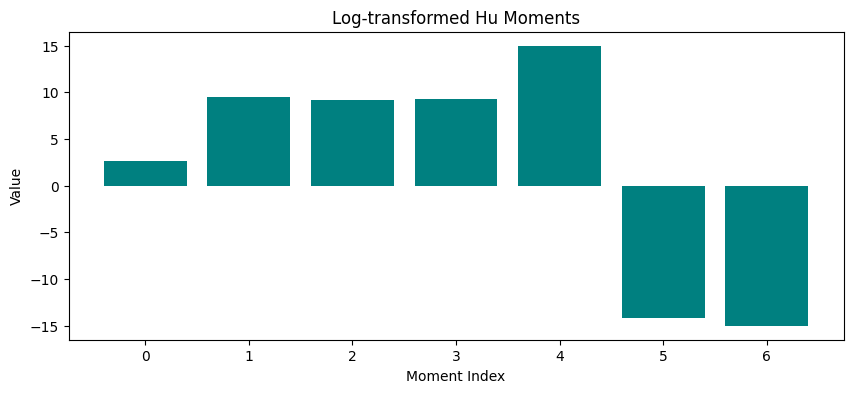

Hu Moments (Original):


array([ 2.13656215e-03,  3.49748228e-10,  6.33669861e-10,  5.38124844e-10,
        3.03391440e-19, -6.37159143e-15, -8.18411085e-20])

Hu Moments (Log scale):


array([  2.67028447,   9.45624324,   9.19813626,   9.26911615,
        14.99986826, -14.13243874, -14.99996446])

In [25]:
# Растягиваем диапазон
stretched = cv2.normalize(grey_image, empty, 0, 255, cv2.NORM_MINMAX).astype(np.uint8)

# Вычисляем моменты
# Сначала обычные моменты
moments_raw = cv2.moments(stretched)
# Затем инвариантные моменты Ху (их всегда 7 штук)
hu_moments = cv2.HuMoments(moments_raw).flatten()

# Логарифмическое преобразование (стандарт для моментов Ху)
# Значения моментов Ху очень маленькие и разные по порядку,
# поэтому их обычно переводят в логарифмический масштаб:
hu_log = -1 * np.sign(hu_moments) * np.log10(np.abs(hu_moments) + 1e-15)

plt.figure(figsize=(10, 4))
plt.bar(range(7), hu_log, color="teal")
plt.title("Log-transformed Hu Moments")
plt.xlabel("Moment Index")
plt.ylabel("Value")
plt.show()

print("Hu Moments (Original):")
display(hu_moments)
print("Hu Moments (Log scale):")
display(hu_log)

#### Векторизация на основе LBP (Local Binary Patterns)

Метод LBP (Локальные бинарные шаблоны) — это мощный и быстрый алгоритм описания микроструктуры изображения.

В отличие от глобальных признаков (как моменты Ху), LBP смотрит на то, как каждый пиксель соотносится со своими ближайшими соседями, кодируя локальную текстуру в короткий двоичный код.

1. Распознавание лиц (Face Recognition)
2. Детекция «живого» пользователя (Liveness Detection)
3. Классификация лесных массивов и растительности
4. Автоматизированный анализ гистологических срезов
5. Распознавание дорожных покрытий
6. Анализ качества поверхностей в промышленности

Как это работает:
- Берется пиксель и его 8 соседей.
- Если сосед ярче центрального — ставим 1, если темнее — 0.
- Получаем 8-битное число (например, 10110010).
- По всему изображению строится гистограмма этих чисел. Эта гистограмма и есть вектор признаков.

Главные плюсы:
- Невероятная скорость: вычисляется очень быстро.
- Инвариантность к освещению (изменения яркости и контрастности).

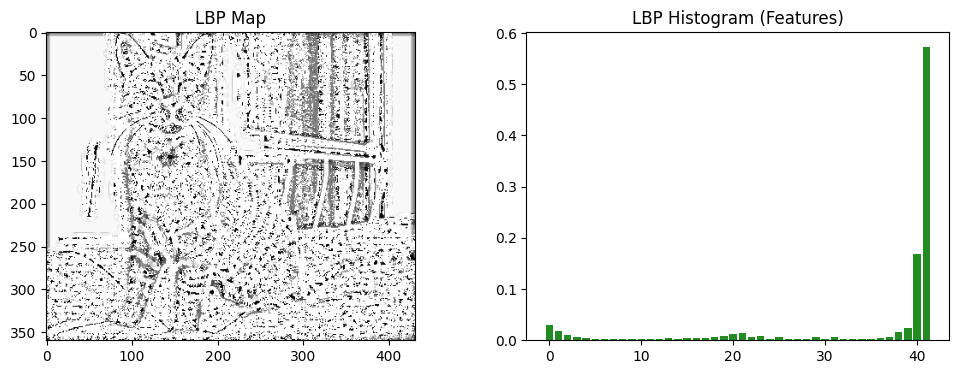

array([0.02914411, 0.01885151, 0.01090487, 0.00648363, 0.00432457,
       0.00317737, 0.0024233 , 0.00241686, 0.00234597, 0.00238464,
       0.00210106, 0.00250064, 0.00317737, 0.0036414 , 0.00336427,
       0.00369296, 0.00446636, 0.00518175, 0.00605182, 0.00919696,
       0.01286414, 0.0144496 , 0.00646429, 0.00893271, 0.00336427,
       0.00650941, 0.00232663, 0.00199149, 0.00166924, 0.00547822,
       0.00155968, 0.00590358, 0.00171436, 0.00237175, 0.00241686,
       0.00260376, 0.004157  , 0.00726991, 0.01665378, 0.02373034,
       0.16899974, 0.57273782])

In [26]:
from skimage.feature import local_binary_pattern

# Параметры LBP
# Обычно P = 8 * R. Для радиуса 5 возьмем 40 точек.
radius = 5
n_points = 8 * radius

# Вычисляем LBP карту
# 'uniform' — самый стабильный метод, инвариантный к повороту
lbp_map = local_binary_pattern(grey_image, n_points, radius, method="uniform")

# Создаем гистограмму
# Количество бинов для 'uniform' метода равно n_points + 2
n_bins = int(lbp_map.max() + 1)
lbp_hist, _ = np.histogram(
    lbp_map.ravel(), bins=n_bins, range=(0, n_bins), density=True
)

fig, axes = plt.subplots(1, 2, figsize=(12, 4))
axes[0].imshow(lbp_map, cmap="gray")
axes[0].set_title("LBP Map")
axes[1].bar(range(len(lbp_hist)), lbp_hist, color="forestgreen")
axes[1].set_title("LBP Histogram (Features)")
plt.show()

display(lbp_hist)

#### HOG (Histogram of Oriented Gradients)

Дескриптор HOG (Гистограмма ориентированных градиентов) — это метод для обнаружения объектов по их характерному силуэту. 

В отличие от LBP, который смотрит на микротекстуру, HOG фокусируется на направлении контуров в небольших ячейках изображения.

1. Детекция пешеходов (Pedestrian Detection)
2. Распознавание поз человека (Human Pose Estimation)
3. Классификация транспортных средств
4. Поиск лиц (Face Detection)
5. Распознавание дорожных знаков
6. Анализ рукописных символов

Как это работает:
- Картинка разбивается на мелкие ячейки (например, 8x8 пикселей).
- В каждой ячейке вычисляется направление градиента (куда "смотрит" контур).
- Строится гистограмма: сколько линий под углом 0°, сколько под 45°, 90° и т.д.
- Ячейки объединяются в блоки для нормализации (чтобы освещение не влияло на результат).

Главные плюсы:
- Геометрическая точность: отлично схватывает общую форму объекта.
- Светоустойчивость: из-за нормализации блоков метод слабо зависит от теней и яркости.

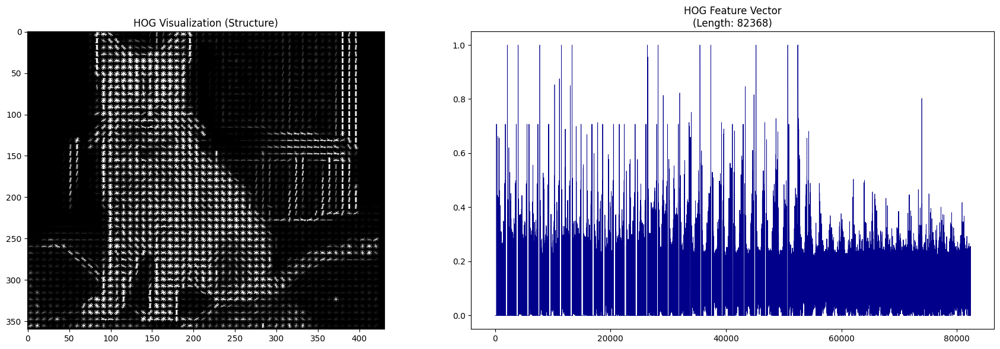

'Размерность вектора HOG: (82368,)'

array([0.        , 0.        , 0.        , ..., 0.13124346, 0.02593927,
       0.05915063], shape=(82368,))

In [27]:
from skimage import exposure
from skimage.feature import hog

# Извлекаем HOG признаки
# orientations — количество направлений (обычно 9)
# pixels_per_cell — размер ячейки (чем меньше, тем детальнее, но длиннее вектор)
# cells_per_block — нормализация по соседним ячейкам
fd, hog_image = hog(
    grey_image,
    orientations=9,
    pixels_per_cell=(8, 8),
    cells_per_block=(2, 2),
    visualize=True,
    channel_axis=None,
)

# Улучшаем видимость HOG-карты (для красоты)
hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))  # type: ignore

fig, axes = plt.subplots(1, 2, figsize=(18, 6))
axes[0].imshow(hog_image_rescaled, cmap="gray")
axes[0].set_title("HOG Visualization (Structure)")
axes[1].plot(fd, color="darkblue", linewidth=0.5)
axes[1].set_title(f"HOG Feature Vector\n(Length: {len(fd)})")
plt.tight_layout()
plt.show()

display(f"Размерность вектора HOG: {fd.shape}")
display(fd)

#### Векторизация на основе ORB (Oriented FAST and Rotated BRIEF)

ORB — это быстрый и эффективный алгоритм поиска «контрольных точек» (keypoints) и их описания. Он был создан как бесплатная и мощная альтернатива платным алгоритмам (SIFT/SURF).

Этот метод векторизации хорошо работает в задачах, где нужно сопоставить два изображения в реальном времени.

1. Склейка панорам (Image Stitching)
2. Дополненная реальность (AR)
3. Робототехника и навигация (SLAM)
4. Поиск объектов в базе данных (Object Retrieval)
5. Трекинг объектов на видео
6. Сравнение дубликатов фотографий

Почему ORB так популярен:
- Скорость: Работает в десятки раз быстрее SIFT.
- Устойчивость: Не боится поворотов (Rotation Invariant) и изменения масштаба.
- Бесплатность: В отличие от многих других дескрипторов, у него открытая лицензия (Open Source).

Техническая суть:
- FAST: Находит «интересные» точки (обычно углы).
- BRIEF: Описывает их коротким бинарным кодом (строка из 0 и 1), который очень быстро сравнивается через расстояние Хэмминга.

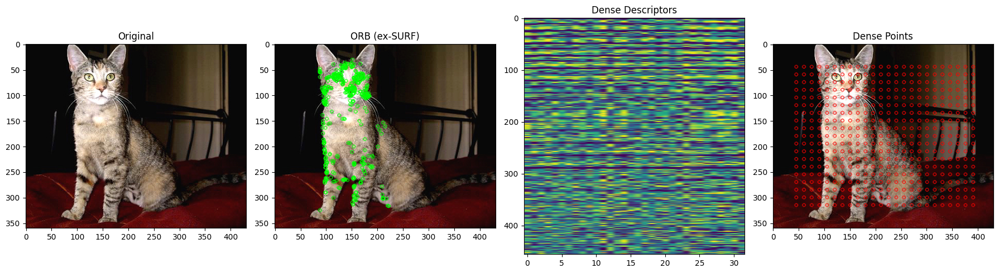

array([[171, 198, 198, ..., 254, 252, 188],
       [143, 246, 101, ..., 222, 211, 245],
       [ 47, 114, 252, ..., 255, 216, 243],
       ...,
       [245,  92, 109, ..., 249, 118, 113],
       [ 29, 251, 220, ..., 187,  73,   1],
       [  7, 188, 158, ...,  96,  43, 130]], shape=(500, 32), dtype=uint8)

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [ 11,  16,  56, ...,   4,  13,  87],
       ...,
       [241, 154,  76, ..., 136,  88,   1],
       [ 53, 164, 236, ..., 200, 240, 128],
       [144,   4, 221, ..., 128, 128,  48]], shape=(456, 32), dtype=uint8)

In [28]:
# 1. Инициализируем детектор ORB (замена SURF)
orb = cv2.ORB.create()

# Стандартный поиск ключевых точек
kp, des_surf = orb.detectAndCompute(grey_image, None)
# Рисуем точки прямо на картинке для визуализации
img_with_keypoints = cv2.drawKeypoints(image_rgb, kp, empty, color=(0, 255, 0), flags=0)


# Плотный поиск (Dense) — создаем сетку точек вручную
def get_dense_orb(img: np.ndarray, spacing: int) -> tuple:
    h, w = img.shape[:2]
    # Создаем сетку KeyPoint-ов
    kp_dense = [
        cv2.KeyPoint(x, y, spacing)
        for y in range(0, h, spacing)
        for x in range(0, w, spacing)
    ]
    # Вычисляем дескрипторы для этих точек
    kp_dense, des_dense = orb.compute(img, kp_dense)
    return des_dense, kp_dense


des_dense_15, kp_15 = get_dense_orb(grey_image, 15)

# Визуализация плотных точек
img_dense_points = cv2.drawKeypoints(image_rgb, kp_15, empty, color=(255, 0, 0))

fig, axes = plt.subplots(1, 4, figsize=(18, 5))
axes[0].imshow(image_rgb)
axes[0].set_title("Original")
axes[1].imshow(img_with_keypoints)
axes[1].set_title("ORB (ex-SURF)")
axes[2].imshow(des_dense_15, aspect="auto", cmap="viridis")
axes[2].set_title("Dense Descriptors")
axes[3].imshow(img_dense_points)
axes[3].set_title("Dense Points")

plt.tight_layout()
plt.show()

display(des_surf)
display(des_dense_15)

#### Векторизация на основе гистограммы цветов

Векторизация на основе гистограммы цветов — это самый простой и быстрый способ описать «цветовой паспорт» изображения.

В отличие от HOG или ORB, этот метод полностью игнорирует формы и текстуры, фокусируясь только на том, сколько и каких красок использовано в кадре.

1. Поиск изображений по содержанию (CBIR)
2. Сортировка продукции по цвету
3. Автоматическая коррекция баланса белого
4. Детекция смены сцен в видео (Shot Detection)
5. Сегментация кожи (Skin Detection)
6. Мониторинг экологических зон

Почему этот метод удобен:
- Инвариантность к повороту и масштабу: Если вы перевернете фото или увеличите объект, его гистограмма (процентное соотношение цветов) практически не изменится.
- Высокая скорость: Сравнение двух векторов-гистограмм (например, через корреляцию или расстояние Хи-квадрат) происходит за доли миллисекунд.
- Простота реализации: Не требует обучения сложных моделей.

Для векторизации часто используют пространство HSV вместо RGB, так как оно лучше разделяет информацию о цвете (Hue) и освещенности (Value), что делает вектор более устойчивым к теням.


In [29]:
def get_color_hist(img: np.ndarray) -> np.ndarray:
    hist_features = []
    for i in range(3):  # По каналам R, G, B
        hist = cv2.calcHist([img], [i], None, [32], [0, 256])
        hist_features.append(cv2.normalize(hist, hist).flatten())
    return np.concatenate(hist_features)


hist = get_color_hist(image_rgb)
display(hist)

array([0.08350152, 0.8666499 , 0.15564214, 0.11823279, 0.12944722,
       0.12741774, 0.12997028, 0.16062169, 0.16235825, 0.13216715,
       0.11697745, 0.10559563, 0.14509723, 0.08659804, 0.05739029,
       0.04830995, 0.04473221, 0.04161476, 0.04504605, 0.0470546 ,
       0.04692907, 0.04588294, 0.04130093, 0.03778595, 0.03414544,
       0.03500327, 0.0330784 , 0.03104892, 0.03098615, 0.02617399,
       0.02337038, 0.05619771, 0.2052319 , 0.95132846, 0.10341188,
       0.07286297, 0.04652521, 0.04405062, 0.04452818, 0.05182171,
       0.05643805, 0.05737868, 0.079404  , 0.04504914, 0.0374083 ,
       0.03193815, 0.03088174, 0.03015818, 0.03331292, 0.03529549,
       0.03067915, 0.02975298, 0.02643906, 0.02532477, 0.02491957,
       0.02451437, 0.02179377, 0.02192401, 0.01926129, 0.01675776,
       0.01321229, 0.00914586, 0.00638184, 0.01823383, 0.24624933,
       0.9480921 , 0.08759516, 0.05830096, 0.0497454 , 0.06541917,
       0.06384496, 0.05127856, 0.04049172, 0.04906096, 0.03602

### Пример классификации изображений

#### Загрузка, аугментация и векторизация изображений

Конвейер (pipeline) для извлечения комплексных признаков из изображений для задачи классификации «кошки против собак». 

Конвейер объединяет информацию о текстуре, цвете и форме в один длинный вектор признаков (feature vector).

Ключевые этапы обработки (Функция extract_all):
- Текстура Харалика (Haralick): вычисляются 6 свойств (контраст, гомогенность и др.) по 4 направлениям. Это помогает отличить общую «гладкость» или «зашумленность» изображения.
- LBP (Local Binary Patterns): анализирует микроструктуру (например, ворсистость шерсти). Результат представляется в виде гистограммы из 26 значений.
- Цвет в пространстве HSV: извлекаются гистограммы каналов Hue (Тон) и Saturation (Насыщенность). Это позволяет алгоритму ориентироваться на масть животного (рыжий, серый, белый), игнорируя общую яркость освещения.
- HOG (Histogram of Oriented Gradients): описывает общие контуры и структуру тела (уши, морда, лапы). Чтобы векторы были одинаковой длины, все изображения предварительно ресайзятся до 128х128.

В основном цикле реализована простая аугментация данных:
- Оригинал: Извлекаются признаки исходного фото.
- Отражение (Flip): Фото зеркалится по горизонтали, и признаки извлекаются снова.

Это удваивает размер датасета и учит будущую модель распознавать животное независимо от того, в какую сторону оно смотрит.

На выходе получается таблица, где колонка features содержит объединенный вектор (NumPy array).

Этот вектор готов для подачи в классические алгоритмы машинного обучения, такие как SVM (Support Vector Machine), Random Forest или Gradient Boosting (XGBoost/CatBoost).

Все данные (путь, группа, итоговый вектор и числовая метка: cat=0, dog=1) сохраняются в DataFrame.

In [ ]:
from glob import glob

import cv2
import numpy as np
import pandas as pd
from skimage.feature import graycomatrix, graycoprops, hog


# Вспомогательная функция для Haralick
def get_haralick(gray: np.ndarray) -> np.ndarray:
    # Считаем GLCM для 4 направлений
    glcm = graycomatrix(
        gray,
        distances=[1],
        angles=[0, np.pi / 4, np.pi / 2, 3 * np.pi / 4],
        levels=256,
        symmetric=True,
        normed=True,
    )
    # Извлекаем основные свойства
    props = ["contrast", "dissimilarity", "homogeneity", "energy", "correlation", "ASM"]
    return np.array([graycoprops(glcm, p).ravel() for p in props]).ravel()


df = pd.DataFrame(columns=["img", "group", "features", "label"])
labels = {"cat": 0, "dog": 1}

path = "data/images/cat-dog/"
images = glob(f"{path}*/*.jpg")


def extract_all(image_rgb: np.ndarray) -> np.ndarray:
    # Подготовка
    hsv = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2HSV)
    gray = cv2.cvtColor(image_rgb, cv2.COLOR_RGB2GRAY)
    # Ресайз до единого размера (важно для HOG и сопоставимости признаков)
    resized = cv2.resize(gray, (128, 128))

    # Извлечение признаков
    # Текстура
    h_feat = get_haralick(resized)
    # Текстура LBP — отлично ловит фактуру шерсти
    lbp = local_binary_pattern(resized, P=24, R=3, method="uniform")
    lbp_hist, _ = np.histogram(lbp.ravel(), bins=26, range=(0, 26), density=True)
    # Цвет в HSV (Гистограмма по тону и насыщенности)
    # Канал H (оттенок) дает больше информации о масти животного
    hist_h = cv2.calcHist([hsv], [0], None, [32], [0, 180])
    hist_s = cv2.calcHist([hsv], [1], None, [32], [0, 256])
    color_feat = np.concatenate(
        [cv2.normalize(hist_h, empty).flatten(), cv2.normalize(hist_s, empty).flatten()]
    )
    # Структура (HOG)
    # Используем фиксированный размер, чтобы длина вектора была всегда одинаковой
    hog_f = hog(
        resized,
        orientations=9,
        pixels_per_cell=(8, 8),
        cells_per_block=(2, 2),
        feature_vector=True,
    )
    # Собираем всё в один вектор
    return np.concatenate([h_feat, lbp_hist, color_feat, hog_f])


for img_file in images:
    # Загрузка и предобработка
    img = cv2.imread(img_file)
    if img is None:
        continue
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    # Извлекаем признаки оригинала
    feat_orig = extract_all(img_rgb)

    # Отражаем по горизонтали и извлекаем признаки еще раз
    img_flipped = cv2.flip(img_rgb, 1)
    feat_flipped = extract_all(img_flipped)

    file_name = img_file.replace(path, "").lower()
    # Определяем метку по названию папки/файла
    label_key = "cat" if file_name.startswith("cat") else "dog"
    target = labels[label_key]

    # Сохранение в DataFrame
    df.loc[len(df.index)] = [f"{file_name}_orig", file_name, feat_orig, target]
    df.loc[len(df.index)] = [f"{file_name}_flip", file_name, feat_flipped, target]

display(f"Размер итогового вектора признаков: {len(df.iloc[0]['features'])}")
display(df.head())
display(df.tail())
display(df.info())

'Размер итогового вектора признаков: 8214'

,img,group,features,label
0,cat/10057.jpg_orig,cat/10057.jpg,"[140.9208907480355, 374.02907805818717, 263.49...",0
1,cat/10057.jpg_flip,cat/10057.jpg,"[140.9208907480355, 347.411060822147, 263.4966...",0
2,cat/10043.jpg_orig,cat/10043.jpg,"[386.42919537404373, 554.7545415091396, 317.41...",0
3,cat/10043.jpg_flip,cat/10043.jpg,"[386.42919537404373, 539.0780581561775, 317.41...",0
4,cat/10080.jpg_orig,cat/10080.jpg,"[385.1895300197187, 522.8614297229404, 350.522...",0


,img,group,features,label
395,dog/10072.jpg_flip,dog/10072.jpg,"[2868.4082185042744, 2173.9568479140316, 1872....",1
396,dog/1000.jpg_orig,dog/1000.jpg,"[519.8339689960864, 627.0275900552443, 188.077...",1
397,dog/1000.jpg_flip,dog/1000.jpg,"[519.8339689960864, 563.8552297105097, 188.077...",1
398,dog/0.jpg_orig,dog/0.jpg,"[538.8105930118413, 751.4521669044226, 477.466...",1
399,dog/0.jpg_flip,dog/0.jpg,"[538.8105930118413, 717.6835513671823, 477.466...",1


<class 'pandas.DataFrame'>
Index: 400 entries, 0 to 399
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   img       400 non-null    str   
 1   group     400 non-null    str   
 2   features  400 non-null    object
 3   label     400 non-null    int64 
dtypes: int64(1), object(1), str(2)
memory usage: 15.6+ KB


None

#### Классификация изображений

Реализация конвейера МО: от отбора признаков до создания ансамбля моделей и их валидации.

Используются объекты Pipeline, которые объединяют предобработку и обучение.

1. Подготовка данных:
- Группировка: Переменная groups используется для того, чтобы оригинальное изображение и его «зеркальная» копия (аугментация) всегда попадали вместе либо в обучающую, либо в тестовую выборку. Это предотвращает «утечку данных» и завышение метрик.
- Масштабирование: Все признаки приводятся к диапазону [0, 1] с помощью MinMaxScaler, что критично для логистической регрессии и нейросетей.
2. Три стратегии обучения:
- Логистическая регрессия (Logistic Regression, линейный метод): использует фильтрацию признаков (SelectKBest) для выбора 150 наиболее значимых характеристик. Хорошо работает, если зависимость признаков от класса линейна.
- Случайный лес (Random Forest, ансамблевый метод): использует больше признаков (300) и устойчив к выбросам. Случайный лес эффективно находит нелинейные зависимости в текстурах.
- Многослойный перцептрон (MLP, нейросетевой метод): вместо простого отбора признаков использует PCA (метод главных компонент) для сжатия данных до 50 наиболее информативных векторов, после чего признаки подаются в полносвязную нейросеть с двумя скрытыми слоями.
3. Создание Ансамбля (Voting). Объединяющая модель VotingClassifier с мягким голосованием (voting="soft") суммирует предсказания (вероятности) трех предыдущих моделей. Это позволяет компенсировать ошибки отдельных алгоритмов и повысить общую стабильность системы.
4. Строгая валидация и визуализация:
- StratifiedGroupKFold: применяется кросс-валидация на 5 фолдов, которая сохраняет баланс классов и учитывает группировку (оригинал + флип).
- Метрика F1: оценка качества проводится по F1-score, что дает более честный результат, чем обычная точность (accuracy), если в данных есть дисбаланс.
- Матрица ошибок (Confusion Matrix): для каждой модели строится график, показывающий количество верных предсказаний и то, как часто алгоритм путает кошек с собаками (ложноположительные и ложноотрицательные результаты).

В коде используется переменная seed (которая определена заранее: seed = 42), чтобы результаты экспериментов были воспроизводимы.

'LogisticRegression'

np.float64(0.7233365293477654)

'RandomForestClassifier'

np.float64(0.7051190572906904)

'MLPClassifier'

np.float64(0.722079415689552)

'VotingEnsemble'

np.float64(0.7318308717438065)

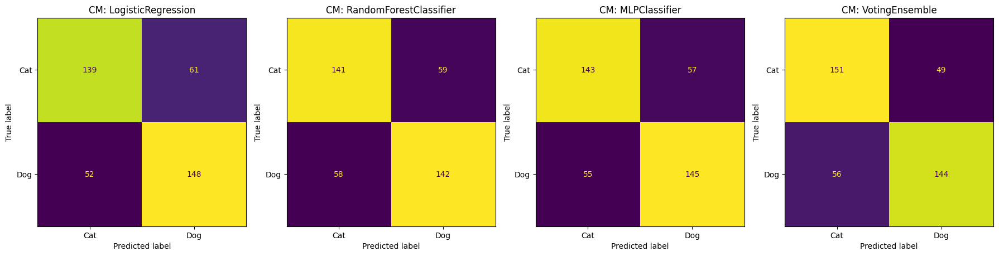

In [46]:
from sklearn.calibration import cross_val_predict
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.feature_selection import SelectKBest, VarianceThreshold, f_classif
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import ConfusionMatrixDisplay, confusion_matrix
from sklearn.model_selection import StratifiedGroupKFold, cross_val_score
from sklearn.neural_network import MLPClassifier
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import MinMaxScaler

groups = df["group"].to_list()
X = np.stack(df["features"].to_list())
y = df["label"].astype(int).to_list()

# Основные пайплайны
model_lr = Pipeline(
    [
        (
            "var_filter",
            VarianceThreshold(),
        ),  # Удаляем признаки, которые везде одинаковы
        ("preprocessing", MinMaxScaler()),  # Масштабируем в [0, 1]
        (
            "select",
            SelectKBest(f_classif, k=150),
        ),  # Оставляем 100 самых важных признаков
        ("classifier", LogisticRegression(max_iter=1000, C=0.1, random_state=seed)),
    ]
)

model_rf = Pipeline(
    [
        ("var_filter", VarianceThreshold()),
        ("preprocessing", MinMaxScaler()),
        ("select", SelectKBest(f_classif, k=300)),
        ("classifier", RandomForestClassifier(n_estimators=300, random_state=seed)),
    ]
)

model_mlp = Pipeline(
    [
        ("var_filter", VarianceThreshold()),
        ("preprocessing", MinMaxScaler()),
        ("pca", PCA(n_components=50, random_state=seed)),
        (
            "classifier",
            MLPClassifier(
                hidden_layer_sizes=(128, 32),
                alpha=0.5,
                max_iter=1000,
                random_state=seed,
            ),
        ),
    ]
)

# Создаем Ансамбль
model_voting = VotingClassifier(
    estimators=[("lr", model_lr), ("rf", model_rf), ("mlp", model_mlp)], voting="soft"
)

models = {
    "LogisticRegression": model_lr,
    "RandomForestClassifier": model_rf,
    "MLPClassifier": model_mlp,
    "VotingEnsemble": model_voting,
}

fig, axes = plt.subplots(1, 4, figsize=(18, 6))
i = 0
for name, model in models.items():
    cv = StratifiedGroupKFold(5, shuffle=True, random_state=seed)
    score = cross_val_score(model, X, y, cv=cv, groups=groups, scoring="f1")
    display(name, score.mean())

    y_pred = cross_val_predict(model, X, y, cv=cv, groups=groups)
    cm = confusion_matrix(y, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=["Cat", "Dog"])
    disp.plot(ax=axes[i], colorbar=False)
    axes[i].set_title(f"CM: {name}")
    i += 1
plt.tight_layout()
plt.show()

#### Определение важности признаков

Формируется список признаков

In [104]:
# Определяем названия категорий признаков
feature_names = []

# 1. Харалик (6 свойств * 4 направления = 24 признака)
props = ["contrast", "dissimilarity", "homogeneity", "energy", "correlation", "ASM"]
for p in props:
    for angle in ["0", "45", "90", "135"]:
        feature_names.append(f"Haralick_{p}_{angle}")

# 2. LBP (26 бинов гистограммы)
for i in range(26):
    feature_names.append(f"LBP_bin_{i}")

# 3. Цвет (32 бина для Hue + 32 бина для Saturation = 64)
for i in range(32):
    feature_names.append(f"Color_Hue_{i}")
for i in range(32):
    feature_names.append(f"Color_Sat_{i}")

# 4. HOG (зависит от настроек, обычно тысячи признаков)
# resized=(128,128), pixels=(8,8), cells=(2,2), orientations=9
# Количество признаков в HOG вычисляется автоматически:
dummy_img = np.zeros((128, 128))
hog_features = hog(
    dummy_img, orientations=9, pixels_per_cell=(8, 8), cells_per_block=(2, 2)
)
for i in range(len(hog_features)):
    feature_names.append(f"HOG_{i}")

all_feature_names = np.array(feature_names)

display(f"Размер итогового вектора признаков: {len(df.iloc[0]['features'])}")
display(f"Размер полученного вектора признаков: {len(all_feature_names)}")

'Размер итогового вектора признаков: 8214'

'Размер полученного вектора признаков: 8214'

#### Важность признаков линейной регрессии

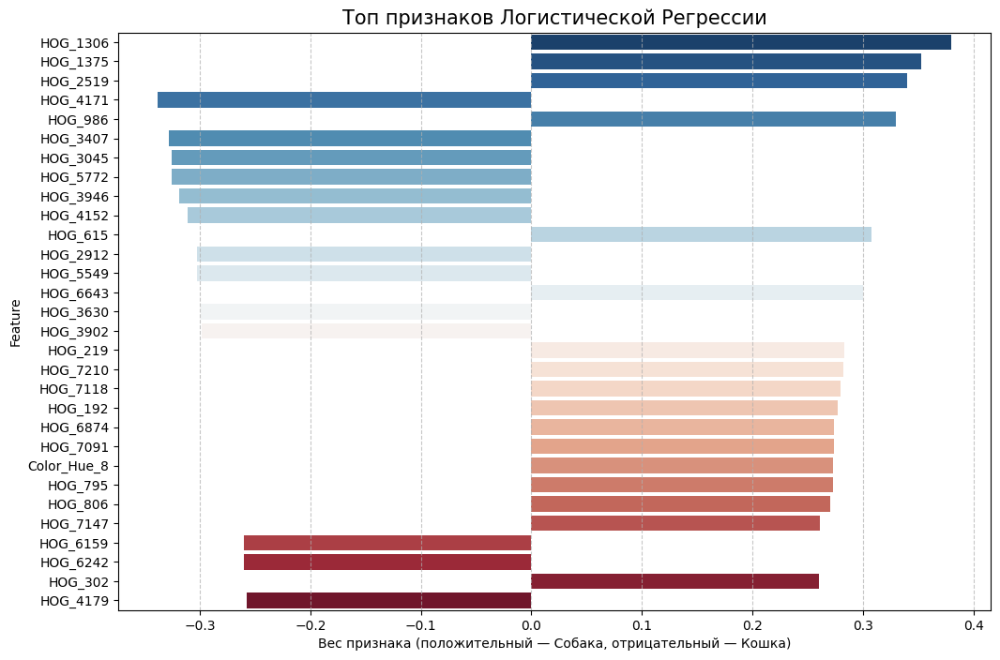

In [ ]:
import seaborn as sns

# Обучаем модель (если еще не обучена)
mr = model_lr.fit(X, y)

# Получаем маску выбранных признаков (те 150, что оставил SelectKBest)
support = mr.named_steps["select"].get_support()

# Фильтруем названия: оставляем только те, что прошли отбор
selected_names = all_feature_names[support]

# Получаем веса (коэффициенты)
coefs = mr.named_steps["classifier"].coef_[0]

importance_df = pd.DataFrame(
    {"Feature": selected_names, "Weight": coefs, "Abs_Weight": np.abs(coefs)}
).sort_values(by="Abs_Weight", ascending=False)
dfimp = importance_df.head(30)

plt.figure(figsize=(12, 8))
sns.barplot(
    x="Weight",
    y="Feature",
    data=dfimp,
    hue="Feature",
    palette="RdBu_r",
    legend=False,
)
plt.title("Топ признаков Логистической Регрессии", fontsize=15)
plt.xlabel("Вес признака (положительный — Собака, отрицательный — Кошка)")
plt.grid(axis="x", linestyle="--", alpha=0.7)
plt.show()

Если признак в топе — это HOG: модель нашла характерную «форму» (например, треугольные уши кошки или висячие уши собаки).

Если в топе Color_Hue: значит, определенный цвет (масть) является сильным маркером для одного из классов.

Если в топе Haralick/LBP: модель опирается на текстуру шерсти.

Знак коэффициента:
- Положительный (+): рост значения этого признака склоняет модель к классу 1 (Dog).
- Отрицательный (-): рост значения склоняет модель к классу 0 (Cat).

#### Визуализация ошибок

Почему модель могла ошибиться?
- Необычный окрас: если кошка имеет окрас, который чаще встречается у собак (например, чепрачный или чисто белый), цветовая гистограмма могла сбить модель с толку.
- Сложный ракурс: если на фото видна только часть морды или животное лежит в странной позе, признаки HOG (структура) и Hu Moments (форма) сильно искажаются.
- Зашумленный фон: если кошка сидит на ковре, текстура которого по Харалику или LBP напоминает жесткую шерсть терьера, модель может принять фон за часть животного.
- Размер объекта: Если животное занимает очень мало места в кадре после ресайза полезные детали (форма ушей, зрачки) превращаются в кашу из пикселей.

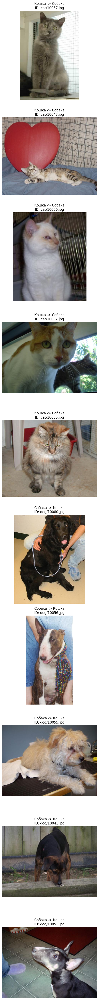

In [ ]:
# Получаем предсказания для лучшей модели
cv = StratifiedGroupKFold(5, shuffle=True, random_state=seed)
y_pred = cross_val_predict(model_voting, X, y, cv=cv, groups=groups)

dfvis = df.copy()
# Добавляем предсказания в DataFrame для удобного поиска
dfvis["pred"] = y_pred
# Удаляем строки для результатов аугментации
dfvis = dfvis[~df["img"].str.contains("_flip")]

count = 5
# Ошибка: Кошка (0), которую назвали Собакой (1) — False Positive
false_dogs = dfvis[(dfvis["label"] == 0) & (dfvis["pred"] == 1)].head(count)
# Ошибка: Собака (1), которую назвали Кошкой (0) — False Negative
false_cats = dfvis[(dfvis["label"] == 1) & (dfvis["pred"] == 0)].head(count)
# Объединяем их
mismatches = pd.concat([false_dogs, false_cats])

# Визуализация
fig, axes = plt.subplots(len(mismatches), 1, figsize=(5, 5 * len(mismatches)))
titles = ["Кошка -> Собака", "Собака -> Кошка"]

for i, (_, row) in enumerate(mismatches.iterrows()):
    img_name = row["group"]
    full_path = f"{path}{img_name}"
    img = cv2.imread(full_path)
    if img is not None:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
        axes[i].imshow(img)

    axes[i].set_title(f"{titles[row['label']]}\nID: {img_name}")
    axes[i].axis("off")

plt.tight_layout()
plt.show()

cat/10056.jpg - классический пример «трудного» изображения для традиционных алгоритмов компьютерного зрения:
1. Фон (Прутья клетки):
    - Оператор Собеля и HOG: Вертикальные прутья клетки создают мощные градиенты. Алгоритм HOG видит четкую структуру параллельных линий, которая может быть интерпретирована моделью как фрагменты шерсти крупной собаки или элементы вольера, которые в обучающей выборке чаще встречались рядом с собаками.
    - Текстура Харалика: Прутья создают высокую периодичность и контрастность, что сбивает с толку текстурные признаки, которые должны были анализировать мягкую шерсть кошки.
2. Цветовая палитра (HSV)
    - Животное имеет кремово-белый окрас с рыжеватыми подпалинами на морде и ушах. В цветовом пространстве HSV такие оттенки часто пересекаются с окрасом популярных пород собак (например, лабрадоров или голден-ретриверов).
    - Если в датасете кошки в основном серые/черные, а собаки светлые, модель могла выучить ложную зависимость «светлый = собака».
3. Форма и ракурс (Hu Moments / HOG)
    - Уши: Кошка прижала уши или они сняты под таким углом, что не образуют характерный «кошачий» треугольник.
    - Морда: Из-за поворота головы и освещения силуэт морды получился более вытянутым и массивным, что в низком разрешении может напоминать морду небольшой собаки.
4. Качество и артефакты
    - На фото заметен цифровой шум и специфический отсвет сетчатки. Это искажает локальные бинарные шаблоны (LBP), которые отвечают за микротекстуру.

Что можно сделать, чтобы исправить это в будущем?
- Удаление фона: Если применить сегментацию (выделение маски) и оставить только животное на пустом фоне, модель перестанет реагировать на прутья клетки.
- Добавление признаков: Возможно, стоит добавить детектор ключевых точек (ORB) специально для поиска глаз и носа.